In [5]:
# Customer Feedback Sentiment Analysis — Streamlit Dashboard (Jupyter Notebook)

import os
import re
from pathlib import Path
from collections import Counter


import pandas as pd
import numpy as np


import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS
import plotly.express as px
import plotly.graph_objects as go


import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer


# Ensure NLTK resources
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\gogin\AppData\Roaming\nltk_data...


True

In [8]:
# 2) Load CSV - adjust path if needed
CSV_PATH = 'flipkart_product.csv'   # or '/mnt/data/flipkart_product.csv'
if not os.path.exists(CSV_PATH):
    raise FileNotFoundError(f'CSV not found at {CSV_PATH} - adjust the path.')

df = pd.read_csv(CSV_PATH)
print('Loaded shape:', df.shape)
display(df.head())

Loaded shape: (189874, 5)


,ProductName,Price,Rate,Review,Summary
0,Candes 12 L Room/Personal Air Cooler?�?�(White...,"�??3,999",5,Super!,Great cooler.. excellent air flow and for this...
1,Candes 12 L Room/Personal Air Cooler?�?�(White...,"�??3,999",5,Awesome,Best budget 2 fit cooler. Nice cooling
2,Candes 12 L Room/Personal Air Cooler?�?�(White...,"�??3,999",3,Fair,The quality is good but the power of air is de...
3,Candes 12 L Room/Personal Air Cooler?�?�(White...,"�??3,999",1,Useless product,Very bad product it's a only a fan
4,Candes 12 L Room/Personal Air Cooler?�?�(White...,"�??3,999",3,Fair,Ok ok product


In [10]:
# 3) Basic cleaning & rating extraction
def extract_rating(x):
    if pd.isna(x): return np.nan
    try:
        if isinstance(x, (int, float)): return float(x)
        s = str(x)
        m = re.search(r'\d+(\.\d+)?', s)
        return float(m.group()) if m else np.nan
    except:
        return np.nan

df['rating'] = df.get('Rate', df.get('rate', df.get('Rating', None))).apply(extract_rating) if 'Rate' in df.columns or 'rate' in df.columns or 'Rating' in df.columns else np.nan

for c in ['ProductName','Summary','Review']:
    if c in df.columns:
        df[c] = df[c].fillna('').astype(str)
    else:
        df[c] = ''

# unified text
df['text'] = (df['Summary'].fillna('') + '. ' + df['Review'].fillna('')).str.strip()

# drop exact duplicates & rows with no text
df = df.drop_duplicates().reset_index(drop=True)
df = df[~(df['text'].str.strip() == '')].reset_index(drop=True)

print('After cleaning shape:', df.shape)


After cleaning shape: (165012, 8)


In [11]:
#4) VADER sentiment
sia = SentimentIntensityAnalyzer()
def get_scores(t):
    if not isinstance(t, str) or t.strip()=='':
        return {'neg':0.0,'neu':1.0,'pos':0.0,'compound':0.0}
    return sia.polarity_scores(t)

scores = df['text'].apply(get_scores)
scores_df = pd.DataFrame(list(scores))
df = pd.concat([df, scores_df], axis=1)

def comp_to_label(c):
    if c >= 0.05: return 'positive'
    if c <= -0.05: return 'negative'
    return 'neutral'
df['sentiment'] = df['compound'].apply(comp_to_label)


In [12]:
# 5) Quick EDA prints & plots
print('\\nSentiment counts:')
print(df['sentiment'].value_counts())

print('\\nRating summary:')
print(df['rating'].describe())


\nSentiment counts:
sentiment
positive    137492
negative     21444
neutral       6076
Name: count, dtype: int64
\nRating summary:
count    165010.000000
mean          4.065066
std           1.347123
min           1.000000
25%           4.000000
50%           5.000000
75%           5.000000
max          10.000000
Name: rating, dtype: float64


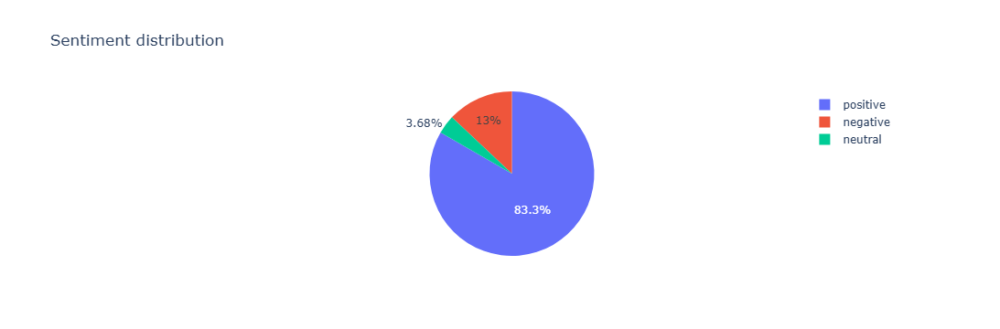

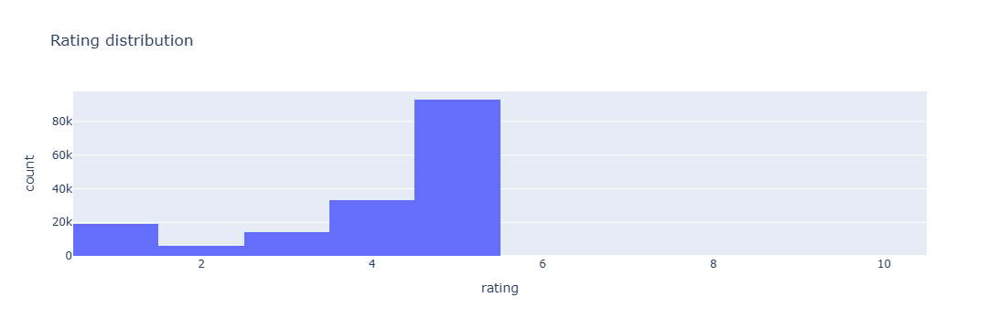

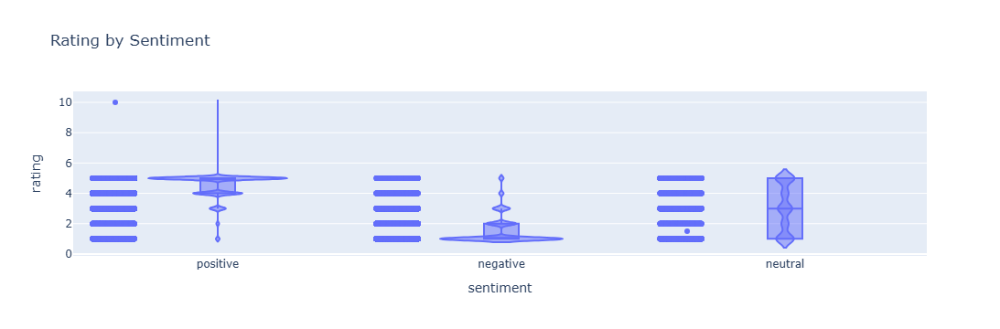

In [13]:
# Plotly visualizations (inline)
fig = px.pie(df, names='sentiment', title='Sentiment distribution')
fig.show()

if df['rating'].notna().sum()>0:
    fig2 = px.histogram(df, x='rating', nbins=10, title='Rating distribution')
    fig2.show()
    fig3 = px.violin(df, x='sentiment', y='rating', box=True, points='all', title='Rating by Sentiment')
    fig3.show()


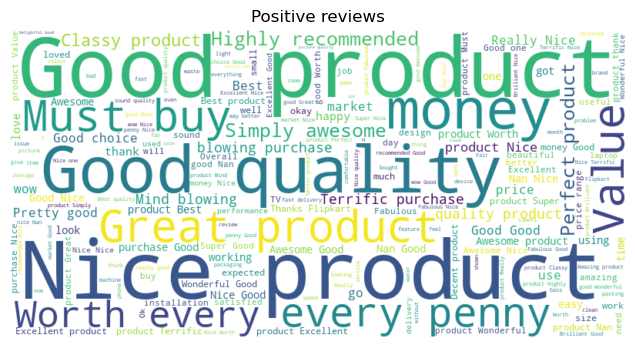

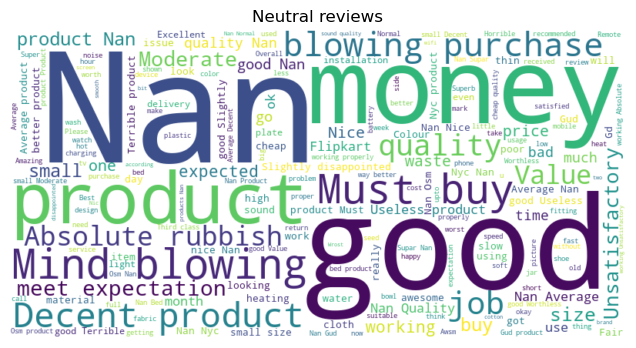

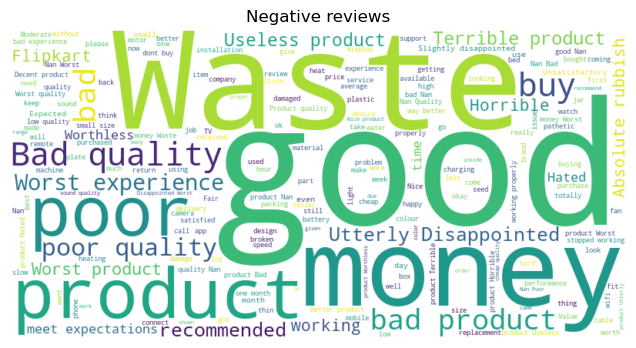

In [14]:
# 6) Wordcloud examples (matplotlib)
def make_wordcloud(texts, title=''):
    txt = ' '.join([t for t in texts if isinstance(t, str)])
    if not txt.strip():
        print('No text for', title); return
    wc = WordCloud(stopwords=STOPWORDS, background_color='white', width=800, height=400).generate(txt)
    plt.figure(figsize=(10,4))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title(title)
    plt.show()

make_wordcloud(df[df['sentiment']=='positive']['text'].tolist(), 'Positive reviews')
make_wordcloud(df[df['sentiment']=='neutral']['text'].tolist(), 'Neutral reviews')
make_wordcloud(df[df['sentiment']=='negative']['text'].tolist(), 'Negative reviews')

In [15]:
# 7) Product-wise Sentiment Summary (Highly Recommended)
prod_sent = df.groupby('ProductName')['sentiment'].value_counts(normalize=True).unstack().fillna(0)
display(prod_sent.head())

sentiment,negative,neutral,positive
ProductName,,,
,0.129954,0.036822,0.833224


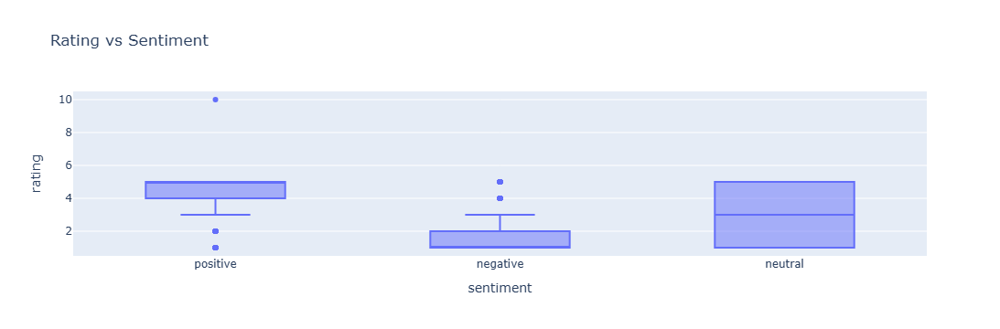

In [16]:
# 8) Rating vs Sentiment Distribution
px.box(df, x='sentiment', y='rating', title='Rating vs Sentiment').show()

In [17]:
# 9) Top Negative Keywords (Complaint Analysis)
from collections import Counter

neg_words = " ".join(df[df['sentiment']=="negative"]['text']).lower().split()
common_neg = Counter(neg_words).most_common(30)
common_neg[:20]

[('not', 10938),
 ('very', 8201),
 ('is', 7612),
 ('product', 6270),
 ('the', 5850),
 ('of', 4776),
 ('bad', 4690),
 ('and', 4149),
 ('quality', 3705),
 ('waste', 3327),
 ('this', 3278),
 ('to', 3226),
 ('it', 3180),
 ('good', 3178),
 ('i', 2937),
 ('worst', 2885),
 ('poor', 2778),
 ('nan', 2658),
 ("don't", 2558),
 ('for', 2352)]

In [19]:
# 10) Product Ranking Dashboard
prod_rank = df.groupby('ProductName').agg(
    avg_sentiment=('compound','mean'),
    avg_rating=('rating','mean'),
    total_reviews=('text','count')
).sort_values('avg_sentiment', ascending=False)

display(prod_rank.head(10))

,avg_sentiment,avg_rating,total_reviews
ProductName,,,
,0.51866,4.065066,165012
